In [1]:
import numpy as np
import astropy as astropy
from astropy.table import QTable
# Set up matplotlib
import matplotlib.pyplot as plt
%matplotlib inline
from astropy import units as u
import matplotlib.pyplot as plt
from astropy import constants as const
import lmfit
import matplotlib as mpl
from astropy.io import fits
import tabulate
import pandas as pd
from lmfit import Parameters 

In [2]:
mask_array = fits.open('dendrogram_mask_pruned_rms3e6_k14_dv3_dd1_dp17_pp6_pm2_gal_02-02-20.fits')
data_mask = mask_array[0].data
header_mask = mask_array[0].header

In [3]:
image_3um = fits.open('mosaic_3um_reprojected_to_500um.fits')
data_3um = image_3um[0].data
header_3um = image_3um[0].header

image_5um = fits.open('mosaic_5um_reprojected_to_500um.fits')
data_5um = image_5um[0].data
header_5um = image_5um[0].header

image_8um = fits.open('mosaic_8um_reprojected_to_500um.fits')
data_8um = image_8um[0].data
header_8um = image_8um[0].header

image_12um = fits.open('mosaic_12um_reprojected_to_500um.fits')
data_12um = image_12um[0].data
header_12um = image_12um[0].header

image_22um = fits.open('mosaic_22um_reprojected_to_500um.fits')
data_22um = image_22um[0].data
header_22um = image_22um[0].header

image_24um = fits.open('mosaic_24um_reprojected_to_500um.fits')
data_24um = image_24um[0].data
header_24um = image_24um[0].header

image_25um = fits.open('mosaic_25um_reprojected_to_500um.fits')
data_25um = image_25um[0].data
header_25um = image_25um[0].header

image_37um = fits.open('mosaic_37um_reprojected_to_500um.fits')
data_37um = image_37um[0].data
header_37um = image_37um[0].header

image_70um = fits.open('mosaic_70um_reprojected_to_500um.fits')
data_70um = image_70um[0].data
header_70um = image_70um[0].header

image_160um = fits.open('mosaic_160um_reprojected_to_500um.fits')
data_160um = image_160um[0].data
header_160um = image_160um[0].header

image_250um = fits.open('mosaic_250um_reprojected_to_500um.fits')
data_250um = image_250um[0].data
header_250um = image_250um[0].header

image_500um = fits.open('mosaic_500um_reprojected_to_500um.fits')
data_500um = image_500um[0].data
header_500um = image_500um[0].header

image_1300um = fits.open('mosaic_cmzoom_reprojected_to_500um.fits')
data_1300um = image_1300um[0].data
header_1300um = image_1300um[0].header

In [4]:
# Code below is for the mask Stuff

In [4]:
from astropy.table import Table 
from astropy.table import hstack
from astropy.table import Column
catalog = Table.read('megacatalog_team_acc_final_say.fits')

In [5]:
# Some useful constants
h       = const.h.to(u.erg * u.s).value
k       = const.k_B.to(u.erg / u.K).value
c       = const.c.to(u.cm / u.s).value
mmp     = 2.8
mh      = const.m_p.to(u.g).value

G = 6.67408e-11
msun = 1.989e33
mh = 1.6737236e-27
pc2cm = 3.08567758e18
as2persr = 4.25e10 
percm2perm = 1.0e6
hplanck = 6.63e-34
clight = 2.99792e8
kboltzmann = 1.381e-23
sin1yr = 3.15569e7

In [6]:
def blackbody_freq_C(freq, T_l, T_m, T_h, N_l, N_m, N_h): # can add T_m and N_m

### dust opacity constants
    k0      = 4.0    #potentially where the issues lie
    beta    = 1.75
    freq0   = 505e9
    ### dust opacity
    kv      = (1./100.) * k0 * (freq/freq0)**beta
    
    tau_l   = mmp * mh * kv * N_l
    tau_m   = mmp * mh * kv * N_m
    tau_h   = mmp * mh * kv * N_h
    
    F_l     = 2*h*freq**3 / (c**2 * (np.exp(h*freq / (k*T_l)) - 1))
    F_m     = 2*h*freq**3 / (c**2 * (np.exp(h*freq / (k*T_m)) - 1))
    F_h     = 2*h*freq**3 / (c**2 * (np.exp(h*freq / (k*T_h)) - 1))
    
    F1_l    = F_l * (1 - np.exp(-tau_l))
    F1_m    = F_m * (1 - np.exp(-tau_m))
    F1_h    = F_h * (1 - np.exp(-tau_h))
    
    I_l     = F1_l * 1.e23 / 1.e6
    I_m     = F1_m * 1.e23 / 1.e6
    I_h     = F1_h * 1.e23 / 1.e6

    return I_l + I_h + I_m

In [7]:
L1 = catalog['index']
SGA = np.zeros(len(catalog['index']))
for i in range(len(catalog['index'])):
    if catalog['leaf_ID'][i][:8] == 'G359.948':
        SGA[i] = 1
    else:
        SGA[i] = 0
        
L3 = catalog['index'][np.where(SGA == 0)]

In [51]:
LF_Arr = np.empty([len(L3), 8]) #Vary b/o input WL
fit_comb_T_l = np.zeros([len(L3)])
fit_comb_T_m = np.zeros([len(L3)])
fit_comb_T_h = np.zeros([len(L3)])
fit_comb_N_l = np.zeros([len(L3)])
fit_comb_N_m = np.zeros([len(L3)])
fit_comb_N_h = np.zeros([len(L3)])

uncert_T_l = np.zeros([len(L3)])
uncert_T_m = np.zeros([len(L3)])
uncert_T_h = np.zeros([len(L3)])
uncert_N_l = np.zeros([len(L3)])
uncert_N_m = np.zeros([len(L3)])
uncert_N_h = np.zeros([len(L3)])

ChiSqr = np.zeros([len(L3)])
Missing_37um = np.zeros([len(L3)])

for i in range(len(L3)):
    Leaf_ID = L3[i]
    
    mask_condition = data_mask == Leaf_ID

    leaf_data_3um = data_3um[np.where(mask_condition == True)]
    
    
    mask_condition = data_mask == Leaf_ID

    leaf_data_5um = data_5um[np.where(mask_condition == True)]
    
    
    mask_condition = data_mask == Leaf_ID

    leaf_data_8um = data_8um[np.where(mask_condition == True)]
    
    
    mask_condition = data_mask == Leaf_ID

    leaf_data_12um = data_12um[np.where(mask_condition == True)]
    
    
    mask_condition = data_mask == Leaf_ID

    leaf_data_22um = data_22um[np.where(mask_condition == True)]
    
    
    mask_condition = data_mask == Leaf_ID

    leaf_data_24um = data_24um[np.where(mask_condition == True)]    

    
    mask_condition = data_mask == Leaf_ID

    leaf_data_25um = data_25um[np.where(mask_condition == True)]

  
    mask_condition = data_mask == Leaf_ID

    leaf_data_37um = data_37um[np.where(mask_condition == True)]


    mask_condition = data_mask == Leaf_ID

    leaf_data_70um = data_70um[np.where(mask_condition == True)]

    
    mask_condition = data_mask == Leaf_ID

    leaf_data_160um = data_160um[np.where(mask_condition == True)]


    mask_condition = data_mask == Leaf_ID

    leaf_data_250um = data_250um[np.where(mask_condition == True)]


    mask_condition = data_mask == Leaf_ID

    leaf_data_500um = data_500um[np.where(mask_condition == True)]
    
    
    mask_condition = data_mask == Leaf_ID

    leaf_data_1300um = data_1300um[np.where(mask_condition == True)]
    
    
    LF_Arr[i, :] = np.array([#np.mean(leaf_data_3um), 
                             np.mean(leaf_data_5um), 
                             #np.mean(leaf_data_8um), 
                             np.mean(leaf_data_12um), 
                             np.mean(leaf_data_22um), 
                             #np.mean(leaf_data_24um), 
                             #np.mean(leaf_data_25um)/(10**6)*(1.7033*10**11), 
                             np.mean(leaf_data_37um)/(10**6)*(1.7033*10**11), 
                             np.mean(leaf_data_70um),
                             np.mean(leaf_data_160um), 
                             np.mean(leaf_data_250um), 
                             np.mean(leaf_data_500um)])
                             #np.mean(leaf_data_1300um)/(10**6)
                                                            
    
    if np.any(leaf_data_37um <= 0 ):
        Missing_37um[i] = 0
    else:
        Missing_37um[i] = 1

    curve_freqs = np.linspace(1e11, 1e15, 5000)
    
    real_wl = np.array([#3.4e-6, 
                        4.6e-6, 
                        #8.0e-6, 
                        12.0e-6, 
                        22.0e-6, 
                        #24.0e-6, 
                        #25.0e-6, 
                        37.0e-6, 
                        70.0e-6,
                        160.0e-6, 
                        250.0e-6, 
                        500.0e-6])*100
                        #1300.0e-6])*100.0

    real_freqs = c/(real_wl)

    RD_comb = lmfit.Model(blackbody_freq_C) 
    params = RD_comb.make_params()
    
    params.add('T_l', value = 20,  vary = True, min = 10, max = None)
    params.add('T_m', value = 30, vary = True, min = 10, max = None)
    params.add('T_h', value = 250, vary = True, min = 10, max = None)
    params.add('N_l', value = 10e25,vary = True, min = 10e22, max = None)
    params.add('N_m', value = 10e23,vary = True, min = 10e17, max = None)
    params.add('N_h', value = 10e19,vary = True, min = 10e13, max = None)
    
    result_comb = RD_comb.fit(LF_Arr[i, :], params, freq = real_freqs, nan_policy='omit')
    
    fit_comb_T_l[i] = result_comb.params['T_l'].value
    fit_comb_T_m[i] = result_comb.params['T_m'].value
    fit_comb_T_h[i] = result_comb.params['T_h'].value

    fit_comb_N_l[i] = result_comb.params['N_l'].value
    fit_comb_N_m[i] = result_comb.params['N_m'].value
    fit_comb_N_h[i] = result_comb.params['N_h'].value
    
    uncert_T_l[i] = result_comb.params['T_l'].stderr
    uncert_T_m[i] = result_comb.params['T_m'].stderr
    uncert_T_h[i] = result_comb.params['T_h'].stderr

    uncert_N_l[i] = result_comb.params['N_l'].stderr
    uncert_N_m[i] = result_comb.params['N_m'].stderr
    uncert_N_h[i] = result_comb.params['N_h'].stderr
    
    ChiSqr[i] = result_comb.chisqr

In [52]:
print(np.median(ChiSqr))

5538389.412006492


In [47]:
L3_ID = np.array(catalog['leaf_ID'][np.isin(catalog['index'], L3)],dtype=str)
Core_State = catalog['SF_final_say'][np.isin(catalog['index'], L3)]
# 1 is star forming, 2 is ambiguoius, 0 is quiescient 

C:\Users\Xavier Braun\AppData\Local\Temp\ipykernel_8796\2264127439.py:14: RuntimeWarning: overflow encountered in exp
  F_l     = 2*h*freq**3 / (c**2 * (np.exp(h*freq / (k*T_l)) - 1))
C:\Users\Xavier Braun\AppData\Local\Temp\ipykernel_8796\2264127439.py:14: RuntimeWarning: overflow encountered in multiply
  F_l     = 2*h*freq**3 / (c**2 * (np.exp(h*freq / (k*T_l)) - 1))
C:\Users\Xavier Braun\AppData\Local\Temp\ipykernel_8796\2264127439.py:15: RuntimeWarning: overflow encountered in exp
  F_m     = 2*h*freq**3 / (c**2 * (np.exp(h*freq / (k*T_m)) - 1))
C:\Users\Xavier Braun\AppData\Local\Temp\ipykernel_8796\2264127439.py:15: RuntimeWarning: overflow encountered in multiply
  F_m     = 2*h*freq**3 / (c**2 * (np.exp(h*freq / (k*T_m)) - 1))


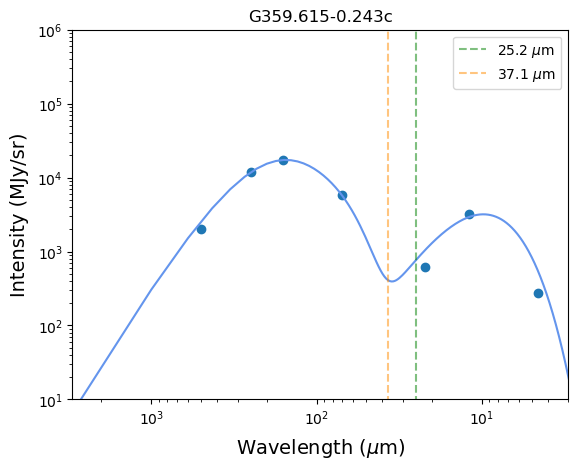

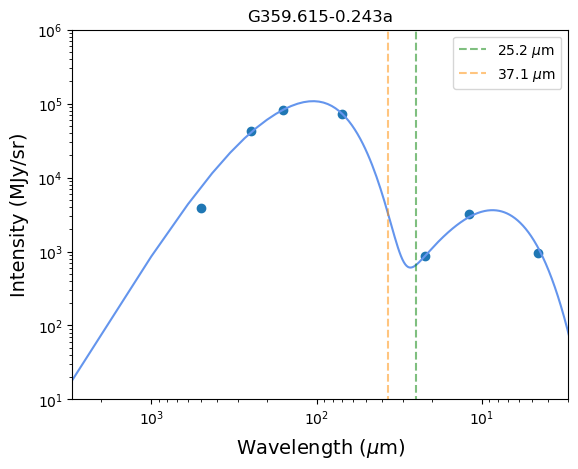

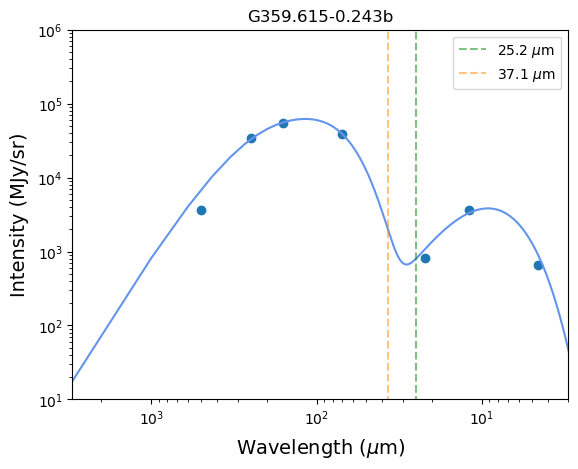

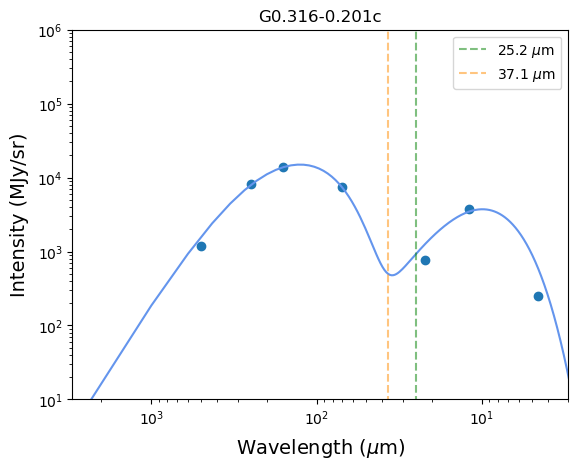

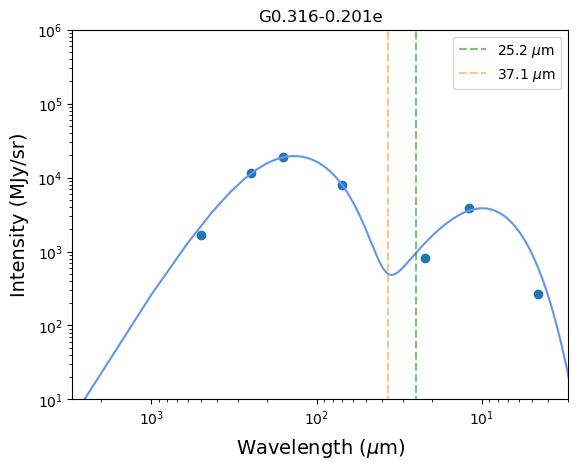

...

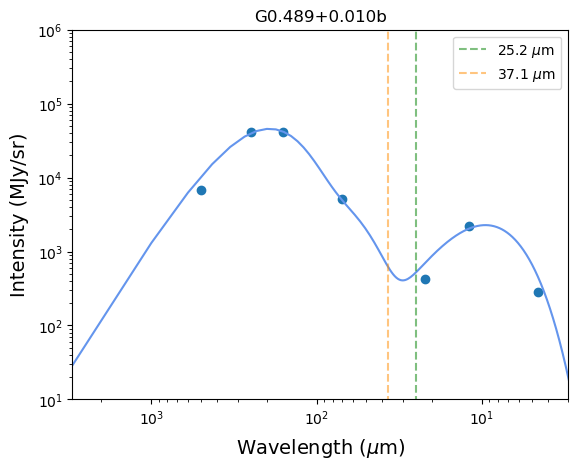

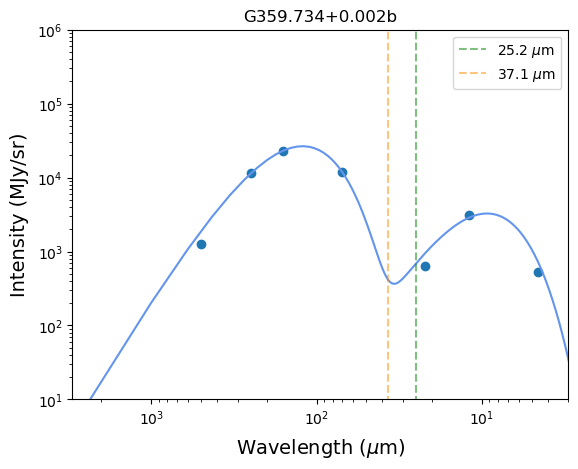

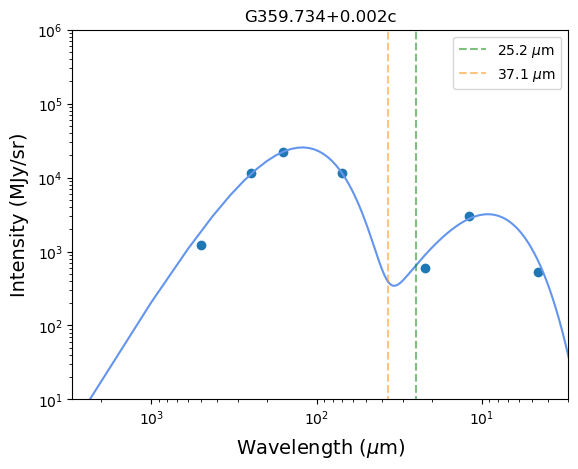

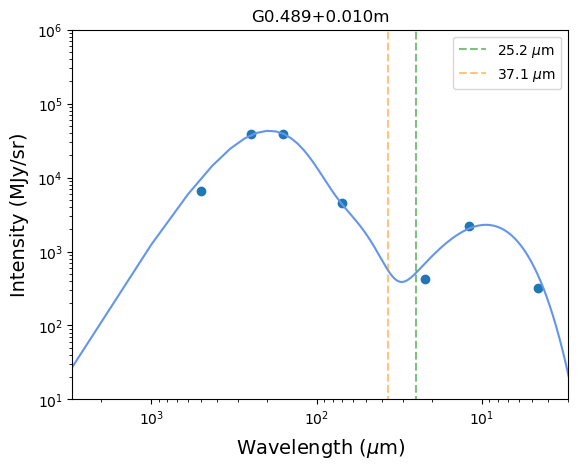

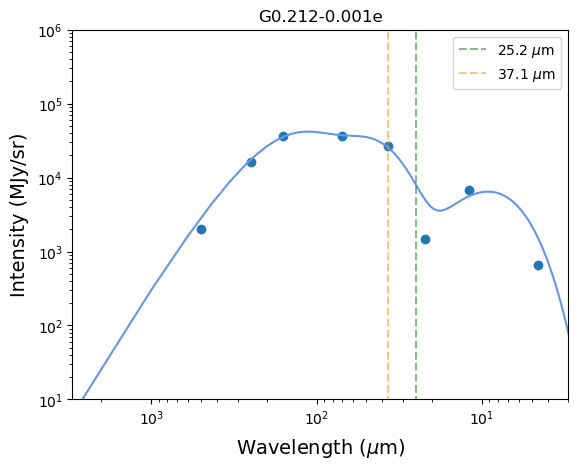

C:\Users\Xavier Braun\AppData\Local\Temp\ipykernel_8796\2264127439.py:16: RuntimeWarning: overflow encountered in exp
  F_h     = 2*h*freq**3 / (c**2 * (np.exp(h*freq / (k*T_h)) - 1))
C:\Users\Xavier Braun\AppData\Local\Temp\ipykernel_8796\2264127439.py:16: RuntimeWarning: overflow encountered in multiply
  F_h     = 2*h*freq**3 / (c**2 * (np.exp(h*freq / (k*T_h)) - 1))


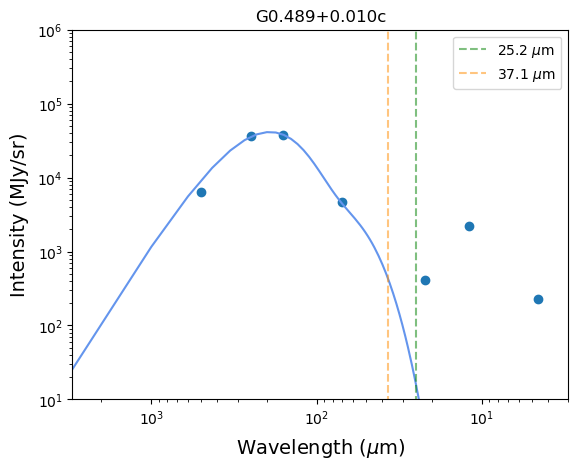

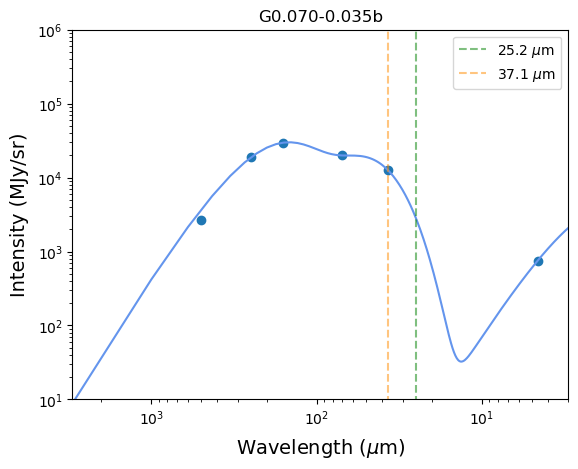

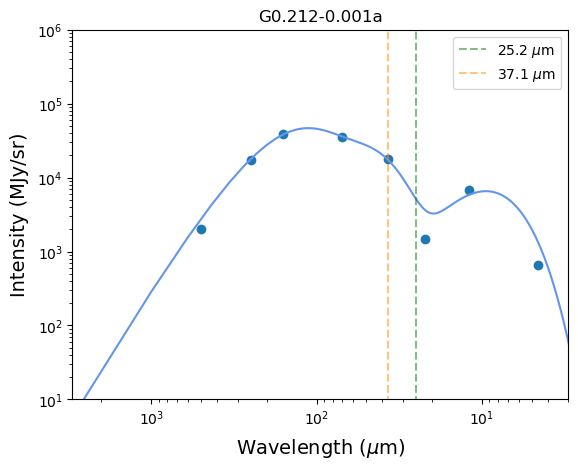

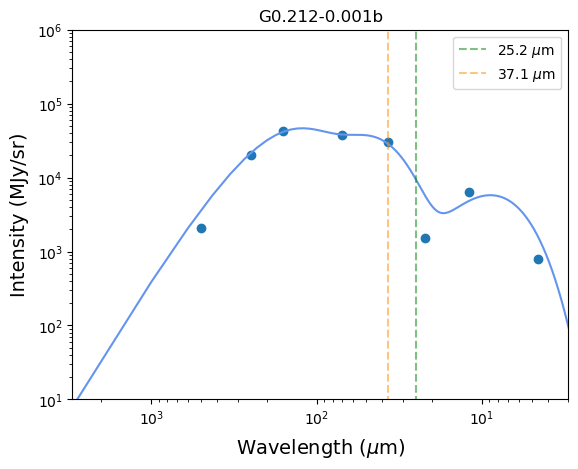

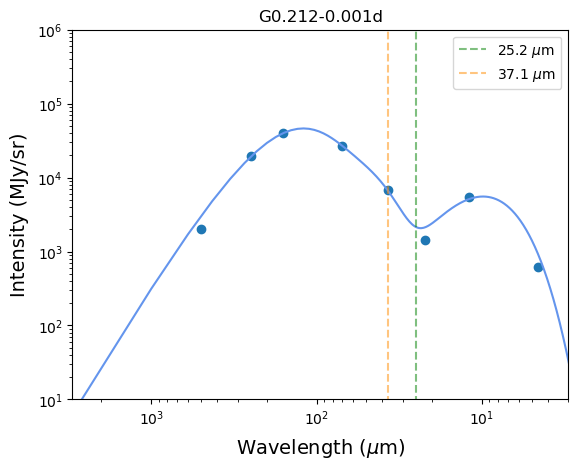

...

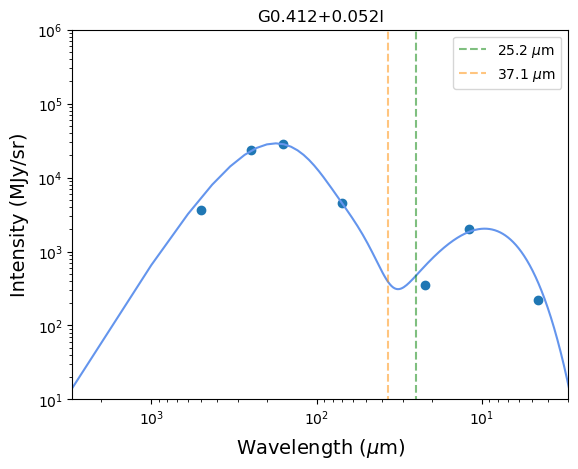

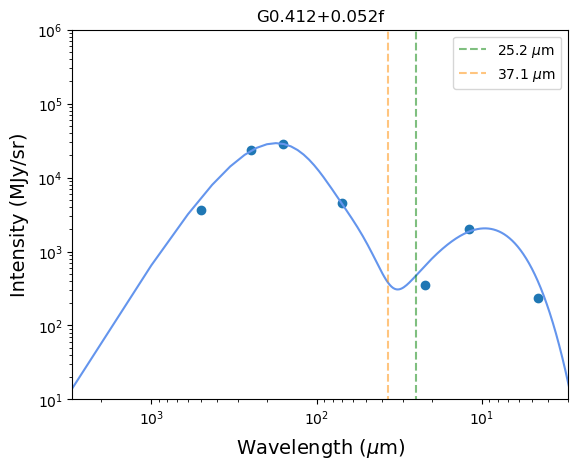

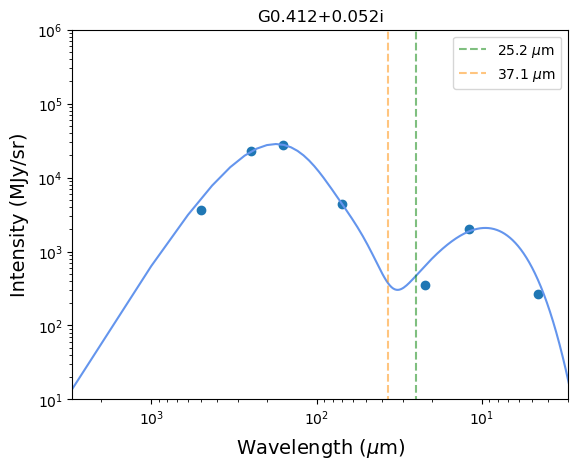

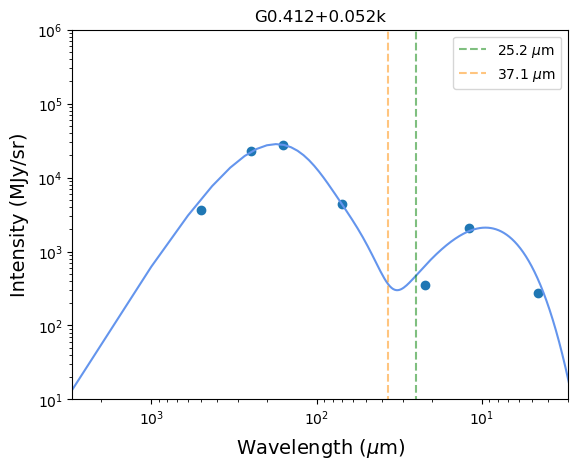

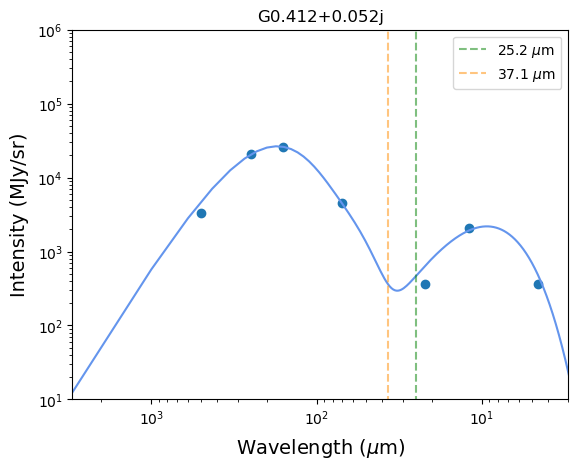

In [53]:
 for i in range(len(L3)):
    
    ycurve_noisy_comb= blackbody_freq_C(curve_freqs, T_l = fit_comb_T_l[i],
                                         N_l = fit_comb_N_l[i], T_h = fit_comb_T_h[i], 
                                         N_h = fit_comb_N_h[i], N_m = fit_comb_N_m[i], 
                                        T_m = fit_comb_T_m[i])   
    plt.plot(1.0e6*clight/real_freqs, LF_Arr[i], 'o')
    plt.scatter(1.0e6*clight/real_freqs, LF_Arr[i], color='k', s = .5)
    plt.plot(1.0e6*clight/curve_freqs, ycurve_noisy_comb, color='cornflowerblue',ls='-')
    plt.plot([25.2,25.2],[0.001,1000000],color='green',ls='--',alpha=0.5, label= '25.2 $\mu$m')
    plt.plot([37.1,37.1],[0.001,1000000],color='darkorange',ls='--',alpha=0.5, label='37.1 $\mu$m')
    plt.xscale('log')
    plt.yscale('log')
    plt.ylim(10,1000000)
    plt.xlim(1.0e6*clight/1.0e11,1.0e6*clight/1.0e14)
    plt.xlabel('Wavelength ($\mu$m)', labelpad=6, fontsize=14)
    plt.ylabel('Intensity (MJy/sr)', labelpad=6, fontsize=14)
    plt.legend(loc='best')
    plt.title((L3_ID[i]))
    #plt.savefig(f'C:/Downloads/IGNITES_regrid_reconvolve(3)/{catalog['leaf_ID'][i]}_Fit_Image.png')
    #plt.close()
    plt.show()

In [54]:
    LF = LF_Arr 
    TL = np.around(fit_comb_T_l, 2)
    TM = np.around(fit_comb_T_m, 2)
    TH = np.around(fit_comb_T_h, 2)
    NL = np.around(fit_comb_N_l)
    NM = np.around(fit_comb_N_m)
    NH = np.around(fit_comb_N_h)
    
    UN_TL = np.around(uncert_T_l)
    UN_TM = np.around(uncert_T_m)
    UN_TH = np.around(uncert_T_h)
    UN_NL = np.around(uncert_N_l)
    UN_NM = np.around(uncert_N_m)
    UN_NH = np.around(uncert_N_h)
    RL = L3
    CS = Core_State
    MS_37um = Missing_37um
    ChiSqr = ChiSqr
    
t = QTable([RL, ChiSqr, TL, TM, TH, NL, NM, NH, UN_TL, UN_TM, UN_TH, UN_NL, UN_NM, UN_NH],
           names=('Leaf ID', 'Chi Square', 'Low Temp', 'Mid Temp', 'High Temp', 
                  'Low Temp N', 'Mid Temp N', 'High Temp N', 
                  'Low Temp Uncert.', 'Mid Temp Uncert.', 'High Temp Uncert.', 
                  'Low Temp N Uncert.', 'Mid Temp N Uncert.', 'High Temp N Uncert.'),
           meta={'name': 'Core Catalog'})
t

Leaf ID,Chi Square,Low Temp,Mid Temp,High Temp,Low Temp N,Mid Temp N,High Temp N,Low Temp Uncert.,Mid Temp Uncert.,High Temp Uncert.,Low Temp N Uncert.,Mid Temp N Uncert.,High Temp N Uncert.
int64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64
99,892365.1953841245,17.45,28.31,311.59,1.1501262840719853e+26,8.23757433585036e+24,3.373294481450181e+19,6.0,17.0,55.0,3.735992502699325e+25,3.987510410562424e+25,2.456906618953957e+19
118,27534199.394106947,15.98,31.84,353.92,2.5670981009495543e+26,6.428888679673467e+25,2.0956119564779495e+19,12.0,4.0,220.0,4.170972807150979e+26,6.270379044454101e+25,5.82362445038048e+19
122,16980871.551027253,16.88,31.22,332.27,2.9030915473201127e+26,3.454916759607251e+25,2.9921303527667077e+19,7.0,6.0,178.0,2.3193728002719313e+26,5.545062633056239e+25,6.7957503703708795e+19
325,917515.9468091356,16.26,27.9,307.72,6.082836393750705e+25,1.3042102708891615e+25,4.19127421319771e+19,15.0,10.0,49.0,6.878284006046072e+25,3.8617787372930077e+25,2.7196367255070364e+19
374,1053496.4931876343,17.5,27.53,307.05,8.301959807672287e+25,1.505776376505507e+25,4.364002873921189e+19,12.0,13.0,51.0,3.427903074639028e+25,6.493775191302917e+25,2.9677096649687626e+19
381,41654466.707636744,34.85,33.53,362.33,2.7871671687025115e+25,1.0652235855027031e+18,3.3117789947047047e+19,269.0,7619080103.0,150.0,2.0109363337027522e+26,2.4800040929202457e+26,6.304995586929768e+19
400,67458376.73431908,34.63,32.4,362.7,4.727820446158779e+25,1.6312183849978368e+18,3.0689710874633527e+19,144.0,2880361046.0,205.0,2.3616808102528508e+26,2.5182784309451256e+26,7.975314108487511e+19
415,7735271.408153804,12.38,31.96,326.44,1.19732409968898e+26,2.401998011028407e+25,5.534866004338941e+19,16.0,2.0,73.0,5.384837779037407e+26,1.2361708108383487e+25,5.1554029433795e+19
424,22686144.281710446,32.3,13.91,331.64,4.9562166595601055e+25,1.68388498645666e+26,4.769530951261062e+19,3.0,18.0,131.0,3.236200777103255e+25,6.339816337135328e+26,7.93402382088367e+19


In [55]:
print('NH Values')
print('Minimum NH:')
print(min(NH))
print('Maximum NH:')
print(max(NH))
print('Median NH:')
print(np.median(NH))

print('TH Values')
print('Minimum TH:')
print(min(TH))
print('Maximum TH:')
print(max(TH))
print('Median TH:')
print(np.median(TH))

print('NM Values')
print('Minimum NM:')
print(min(NM))
print('Maximum NM:')
print(max(NM))
print('Median NM:')
print(np.median(NM))

print('TM Values')
print('Minimum TM:')
print(min(TM))
print('Maximum TM:')
print(max(TM))
print('Median TM:')
print(np.median(TM))

print('NL Values')
print('Minimum NL:')
print(min(NL))
print('Maximum NL:')
print(max(NL))
print('Median NL:')
print(np.median(NL))

print('TL Values')
print('Minimum TL:')
print(min(TL))
print('Maximum TL:')
print(max(TL))
print('Median TL:')
print(np.median(TL))

NH Values
Minimum NH:
140803849827319.0
Maximum NH:
8.42962138580256e+19
Median NH:
2.10415728915909e+19
TH Values
Minimum TH:
20.07
Maximum TH:
1899.26
Median TH:
323.07
NM Values
Minimum NM:
1.0652235855027031e+18
Maximum NM:
3.8051621708234754e+26
Median NM:
4.4894756364958944e+24
TM Values
Minimum TM:
12.93
Maximum TM:
72.04
Median TM:
32.43
NL Values
Minimum NL:
1.0000137103554826e+23
Maximum NL:
4.5737365580813443e+27
Median NL:
2.086220687853346e+26
TL Values
Minimum TL:
12.21
Maximum TL:
34.85
Median TL:
19.08


In [56]:
##Comparing Temp Regions##

HLT = TL[np.where(TH >= 260.3)]
LLT = TL[np.where(TH < 260.3)]

HHT = TH[np.where(TL >= 19.23)]
LHT = TH[np.where(TL < 19.23)]

print(np.median(HLT))
print(np.median(LLT))

print(np.median(HHT))
print(np.median(LHT))

19.1
18.84
329.03
320.565


In [57]:
data = {'Galactic Coords.':L3_ID,
        'Leaf ID': RL,
        'Low Temp':TL,
        'Mid Temp':TM,
        'High Temp':TH,
        'Low Temp N':NL,
        'Mid Temp N':NM,
        'High Temp N':NH,
        'Core State':CS
       }
df = pd.DataFrame(data)
df.to_csv('./HML_SED_Table_all_24um_final.csv', sep=' ')
print(df.to_string())

    Galactic Coords.  Leaf ID  Low Temp  Mid Temp  High Temp    Low Temp N    Mid Temp N   High Temp N  Core State
0    G359.615-0.243c       99     17.45     28.31     311.59  1.150126e+26  8.237574e+24  3.373294e+19         1.0
1    G359.615-0.243a      118     15.98     31.84     353.92  2.567098e+26  6.428889e+25  2.095612e+19         1.0
2    G359.615-0.243b      122     16.88     31.22     332.27  2.903092e+26  3.454917e+25  2.992130e+19         1.0
3      G0.316-0.201c      325     16.26     27.90     307.72  6.082836e+25  1.304210e+25  4.191274e+19         1.0
4      G0.316-0.201e      374     17.50     27.53     307.05  8.301960e+25  1.505776e+25  4.364003e+19         0.0
5      G0.316-0.201g      381     34.85     33.53     362.33  2.787167e+25  1.065224e+18  3.311779e+19         1.0
6      G0.316-0.201a      400     34.63     32.40     362.70  4.727820e+25  1.631218e+18  3.068971e+19         1.0
7      G0.316-0.201k      415     12.38     31.96     326.44  1.197324e+26  2.40

In [16]:
col0 = fits.Column(name='Gal. coords.', format='16A', array= L3_ID)
col1 = fits.Column(name='Gal. long.', format='E', array= catalog['glon'])
col2 = fits.Column(name='Gal. lat.', format='E',  array= catalog['glat'])
col3 = fits.Column(name='Low Temp', format='E', array=TL)
col4 = fits.Column(name='Mid Temp', format='E', array=TM)
col5 = fits.Column(name='High Temp', format='E', array=TH)
col6 = fits.Column(name='Low Temp N', format='E', array=NL)
col7 = fits.Column(name='Mid Temp N', format='E', array=NM)
col8 = fits.Column(name='High Temp N', format='E', array=NH)
col9 = fits.Column(name='Low Temp Uncert.', format='E', array=UN_TL)
col10 = fits.Column(name='Mid Temp Uncert.', format='E', array=UN_TM)
col11 = fits.Column(name='High Temp Uncert.', format='E', array=UN_TH)
col12 = fits.Column(name='Low Temp N Uncert.', format='E', array=UN_NL)
col13 = fits.Column(name='Mid Temp N Uncert.', format='E', array=UN_NM)
col14 = fits.Column(name='High Temp N Uncert.', format='E', array=UN_NH)

FitsTable = fits.ColDefs([col0, col1, col2, col3, col4, col5, col6, col7, col8, col9, col10, col11, col12, col13, col14])
hdu = fits.BinTableHDU.from_columns(FitsTable)

In [17]:
overwrite=True
hdu.writeto('SED_Fit_Table_3Comp_Final.fits', overwrite=True)

In [58]:
NL_0 = (NL[np.where(Core_State == 0)])
NL_1 = (NL[np.where(Core_State == 1)])
NL_2 = (NL[np.where(Core_State == 2)])

TL_0 = (TL[np.where(Core_State == 0)])
TL_1 = (TL[np.where(Core_State == 1)])
TL_2 = (TL[np.where(Core_State == 2)])

UN_TL0 = (UN_TL[np.where(Core_State == 0)])
UN_TL1 = (UN_TL[np.where(Core_State == 1)])
UN_TL2 = (UN_TL[np.where(Core_State == 2)])

UN_NL0 = (UN_NL[np.where(Core_State == 0)])
UN_NL1 = (UN_NL[np.where(Core_State == 1)])
UN_NL2 = (UN_NL[np.where(Core_State == 2)])

In [59]:
Avg_CSL0 = np.median(NL[np.where(Core_State == 0)])
Avg_CSL1 = np.median(NL[np.where(Core_State == 1)])
Avg_CSL2 = np.median(NL[np.where(Core_State == 2)])

Avg_TL0 = np.median(TL[np.where(Core_State == 0)])
Avg_TL1 = np.median(TL[np.where(Core_State == 1)])
Avg_TL2 = np.median(TL[np.where(Core_State == 2)])

[]

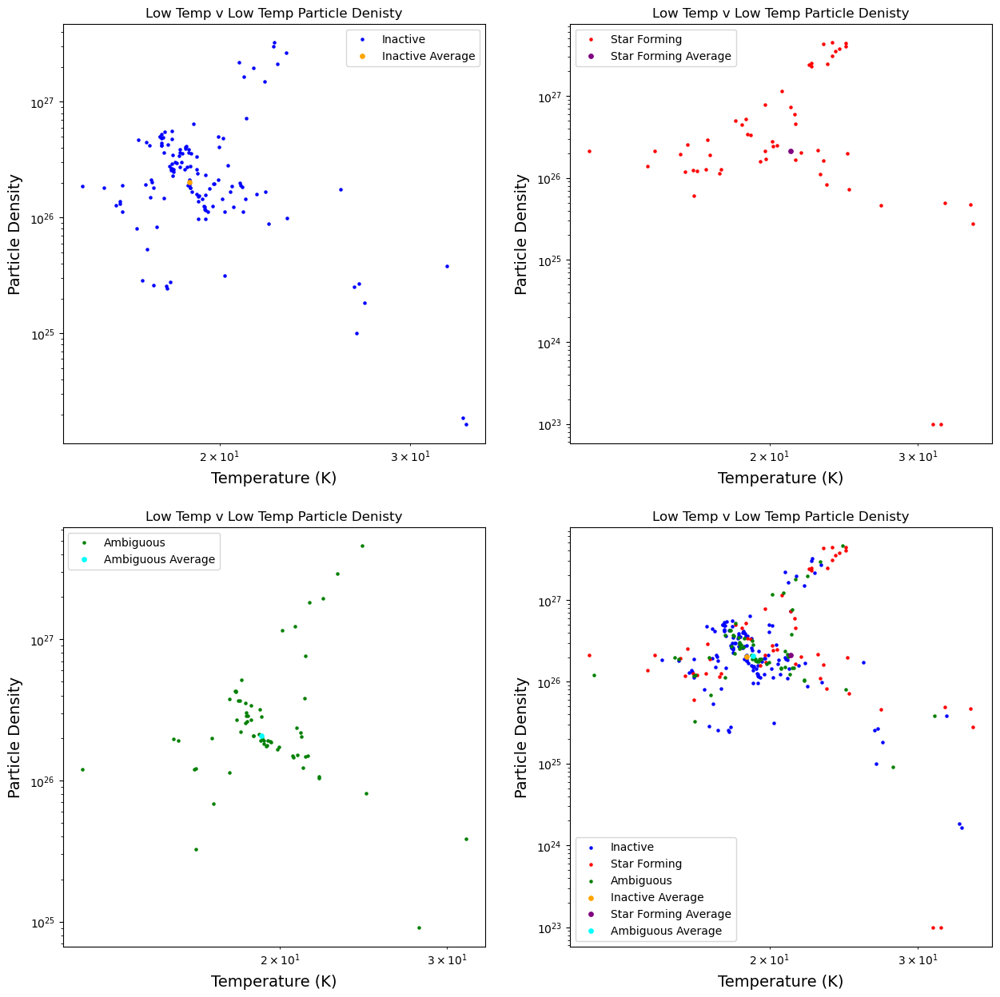

In [60]:

f, ax = plt.subplots(nrows = 2, ncols = 2, figsize = (10, 6))
ax[1,1].scatter(TL_0, NL_0, color='blue', s=5, label = 'Inactive')
ax[1,1].scatter(TL_1, NL_1, color='red', s=5, label = 'Star Forming' )
ax[1,1].scatter(TL_2, NL_2, color='green', s=5, label = 'Ambiguous')
ax[0,0].scatter(TL_0, NL_0, color='blue', s=5, label = 'Inactive')
ax[0,1].scatter(TL_1, NL_1, color='red', s=5, label = 'Star Forming' )
ax[1,0].scatter(TL_2, NL_2, color='green', s=5, label = 'Ambiguous')

ax[0,0].scatter(Avg_TL0, Avg_CSL0, color='orange', s=15, label = 'Inactive Average')
ax[0,1].scatter(Avg_TL1, Avg_CSL1, color='purple', s=15, label = 'Star Forming Average' )
ax[1,0].scatter(Avg_TL2, Avg_CSL2, color='cyan', s=15, label = 'Ambiguous Average')

ax[1,1].scatter(Avg_TL0, Avg_CSL0, color='orange', s=15, label = 'Inactive Average')
ax[1,1].scatter(Avg_TL1, Avg_CSL1, color='purple', s=15, label = 'Star Forming Average' )
ax[1,1].scatter(Avg_TL2, Avg_CSL2, color='cyan', s=15, label = 'Ambiguous Average')

#plt.xlim(-10, 200)
ax[0,0].set_yscale('log')
ax[0,1].set_yscale('log')
ax[1,0].set_yscale('log')
ax[1,1].set_yscale('log')
ax[0,0].set_xscale('log')
ax[0,1].set_xscale('log')
ax[1,0].set_xscale('log')
ax[1,1].set_xscale('log')
#plt.ylim(10e21, 10e28)
ax[0,0].set_xlabel('Temperature (K)', labelpad=6, fontsize=14)
ax[0,1].set_xlabel('Temperature (K)', labelpad=6, fontsize=14)
ax[1,0].set_xlabel('Temperature (K)', labelpad=6, fontsize=14)
ax[1,1].set_xlabel('Temperature (K)', labelpad=6, fontsize=14)
ax[0,0].set_ylabel('Particle Density', labelpad=6, fontsize=14)
ax[0,1].set_ylabel('Particle Density', labelpad=6, fontsize=14)
ax[1,0].set_ylabel('Particle Density', labelpad=6, fontsize=14)
ax[1,1].set_ylabel('Particle Density', labelpad=6, fontsize=14)
ax[0,0].set_title('Low Temp v Low Temp Particle Denisty')
ax[0,1].set_title('Low Temp v Low Temp Particle Denisty')
ax[1,0].set_title('Low Temp v Low Temp Particle Denisty')
ax[1,1].set_title('Low Temp v Low Temp Particle Denisty')
ax[0,0].legend()
ax[0,1].legend()
ax[1,0].legend()
ax[1,1].legend()
f.set_figheight(15)
f.set_figwidth(15)
plt.plot()

In [61]:
NM_0 = (NM[np.where(Core_State == 0)])
NM_1 = (NM[np.where(Core_State == 1)])
NM_2 = (NM[np.where(Core_State == 2)])

TM_0 = (TM[np.where(Core_State == 0)])
TM_1 = (TM[np.where(Core_State == 1)])
TM_2 = (TM[np.where(Core_State == 2)])

UN_TM0 = (UN_TM[np.where(Core_State == 0)])
UN_TM1 = (UN_TM[np.where(Core_State == 1)])
UN_TM2 = (UN_TM[np.where(Core_State == 2)])

UN_NM0 = (UN_NM[np.where(Core_State == 0)])
UN_NM1 = (UN_NM[np.where(Core_State == 1)])
UN_NM2 = (UN_NM[np.where(Core_State == 2)])

In [62]:
Avg_CSM0 = np.median(NM[np.where(Core_State == 0)])
Avg_CSM1 = np.median(NM[np.where(Core_State == 1)])
Avg_CSM2 = np.median(NM[np.where(Core_State == 2)])

Avg_TM0 = np.median(TM[np.where(Core_State == 0)])
Avg_TM1 = np.median(TM[np.where(Core_State == 1)])
Avg_TM2 = np.median(TM[np.where(Core_State == 2)])

[]

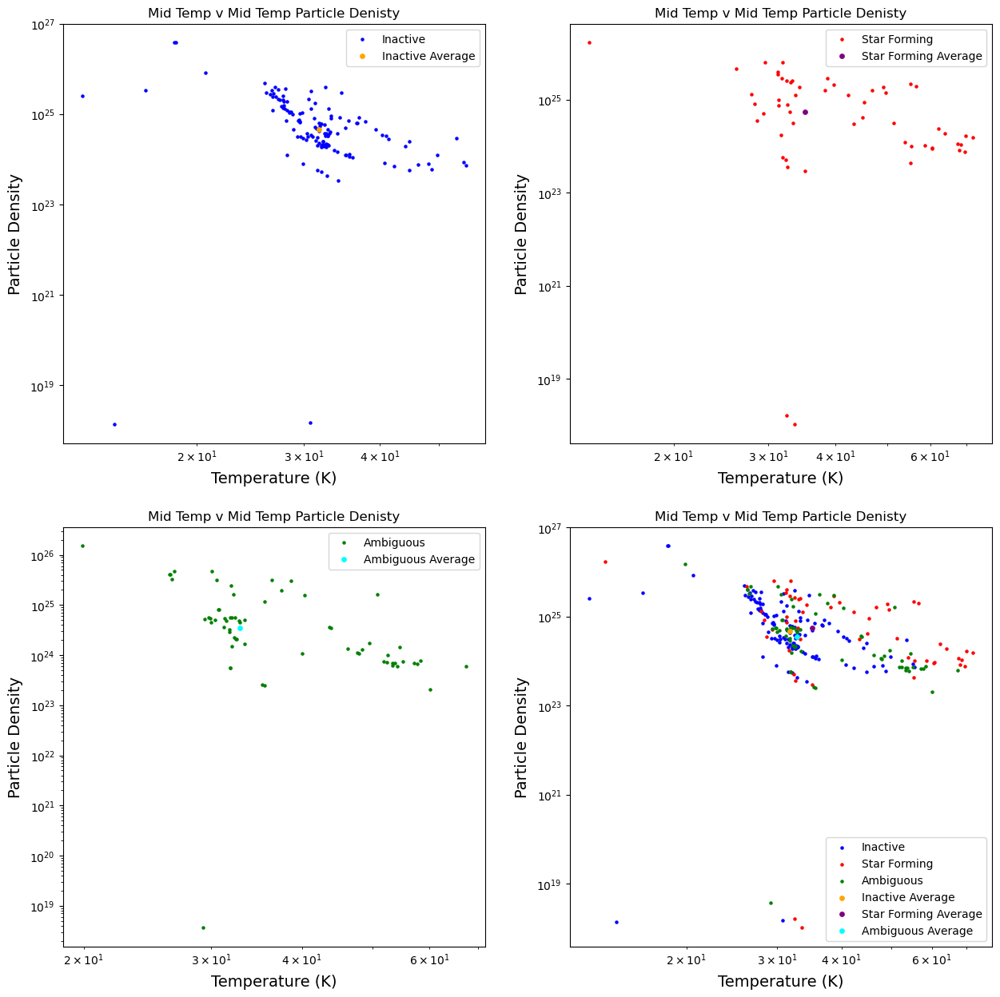

In [63]:
f, ax = plt.subplots(nrows = 2, ncols = 2, figsize = (10, 6))
ax[1,1].scatter(TM_0, NM_0, color='blue', s=5, label = 'Inactive')
ax[1,1].scatter(TM_1, NM_1, color='red', s=5, label = 'Star Forming' )
ax[1,1].scatter(TM_2, NM_2, color='green', s=5, label = 'Ambiguous')
ax[0,0].scatter(TM_0, NM_0, color='blue', s=5, label = 'Inactive')
ax[0,1].scatter(TM_1, NM_1, color='red', s=5, label = 'Star Forming' )
ax[1,0].scatter(TM_2, NM_2, color='green', s=5, label = 'Ambiguous')

ax[0,0].scatter(Avg_TM0, Avg_CSM0, color='orange', s=15, label = 'Inactive Average')
ax[0,1].scatter(Avg_TM1, Avg_CSM1, color='purple', s=15, label = 'Star Forming Average' )
ax[1,0].scatter(Avg_TM2, Avg_CSM2, color='cyan', s=15, label = 'Ambiguous Average')

ax[1,1].scatter(Avg_TM0, Avg_CSM0, color='orange', s=15, label = 'Inactive Average')
ax[1,1].scatter(Avg_TM1, Avg_CSM1, color='purple', s=15, label = 'Star Forming Average' )
ax[1,1].scatter(Avg_TM2, Avg_CSM2, color='cyan', s=15, label = 'Ambiguous Average')

#plt.xlim(-10, 200)
ax[0,0].set_yscale('log')
ax[0,1].set_yscale('log')
ax[1,0].set_yscale('log')
ax[1,1].set_yscale('log')
ax[0,0].set_xscale('log')
ax[0,1].set_xscale('log')
ax[1,0].set_xscale('log')
ax[1,1].set_xscale('log')
#plt.ylim(10e21, 10e28)
ax[0,0].set_xlabel('Temperature (K)', labelpad=6, fontsize=14)
ax[0,1].set_xlabel('Temperature (K)', labelpad=6, fontsize=14)
ax[1,0].set_xlabel('Temperature (K)', labelpad=6, fontsize=14)
ax[1,1].set_xlabel('Temperature (K)', labelpad=6, fontsize=14)
ax[0,0].set_ylabel('Particle Density', labelpad=6, fontsize=14)
ax[0,1].set_ylabel('Particle Density', labelpad=6, fontsize=14)
ax[1,0].set_ylabel('Particle Density', labelpad=6, fontsize=14)
ax[1,1].set_ylabel('Particle Density', labelpad=6, fontsize=14)
ax[0,0].set_title('Mid Temp v Mid Temp Particle Denisty')
ax[0,1].set_title('Mid Temp v Mid Temp Particle Denisty')
ax[1,0].set_title('Mid Temp v Mid Temp Particle Denisty')
ax[1,1].set_title('Mid Temp v Mid Temp Particle Denisty')
ax[0,0].legend()
ax[0,1].legend()
ax[1,0].legend()
ax[1,1].legend()
f.set_figheight(15)
f.set_figwidth(15)
plt.plot()

In [64]:
NH_0 = (NH[np.where(Core_State == 0)])
NH_1 = (NH[np.where(Core_State == 1)])
NH_2 = (NH[np.where(Core_State == 2)])

TH_0 = (TH[np.where(Core_State == 0)])
TH_1 = (TH[np.where(Core_State == 1)])
TH_2 = (TH[np.where(Core_State == 2)])

UN_TH0 = (UN_TH[np.where(Core_State == 0)])
UN_TH1 = (UN_TH[np.where(Core_State == 1)])
UN_TH2 = (UN_TH[np.where(Core_State == 2)])

UN_NH0 = (UN_NH[np.where(Core_State == 0)])
UN_NH1 = (UN_NH[np.where(Core_State == 1)])
UN_NH2 = (UN_NH[np.where(Core_State == 2)])

In [65]:
Avg_CSH0 = np.median(NH[np.where(Core_State == 0)])
Avg_CSH1 = np.median(NH[np.where(Core_State == 1)])
Avg_CSH2 = np.median(NH[np.where(Core_State == 2)])

Avg_TH0 = np.median(TH[np.where(Core_State == 0)])
Avg_TH1 = np.median(TH[np.where(Core_State == 1)])
Avg_TH2 = np.median(TH[np.where(Core_State == 2)])

[]

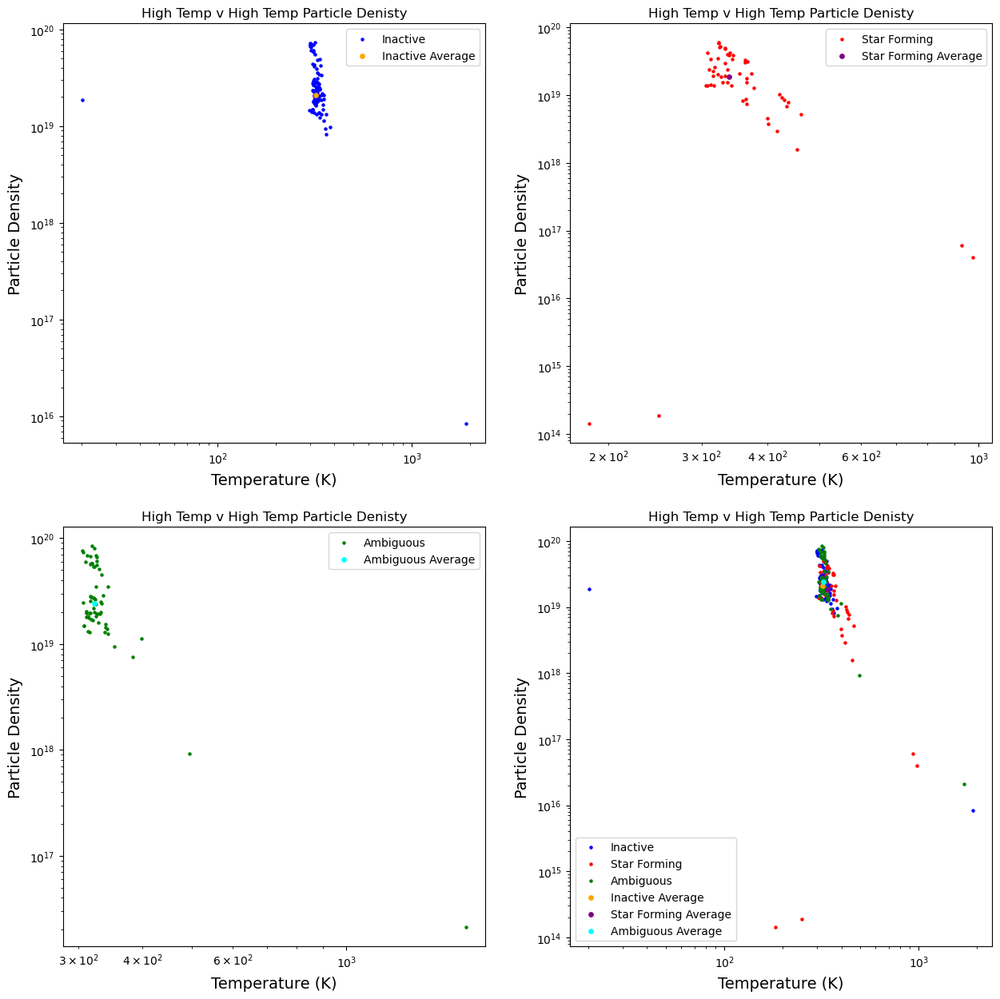

In [66]:
f, ax = plt.subplots(nrows = 2, ncols = 2, figsize = (10, 6))
ax[1,1].scatter(TH_0, NH_0, color='blue', s=5, label = 'Inactive')
ax[1,1].scatter(TH_1, NH_1, color='red', s=5, label = 'Star Forming' )
ax[1,1].scatter(TH_2, NH_2, color='green', s=5, label = 'Ambiguous')
ax[0,0].scatter(TH_0, NH_0, color='blue', s=5, label = 'Inactive')
ax[0,1].scatter(TH_1, NH_1, color='red', s=5, label = 'Star Forming' )
ax[1,0].scatter(TH_2, NH_2, color='green', s=5, label = 'Ambiguous')

ax[0,0].scatter(Avg_TH0, Avg_CSH0, color='orange', s=15, label = 'Inactive Average')
ax[0,1].scatter(Avg_TH1, Avg_CSH1, color='purple', s=15, label = 'Star Forming Average' )
ax[1,0].scatter(Avg_TH2, Avg_CSH2, color='cyan', s=15, label = 'Ambiguous Average')

ax[1,1].scatter(Avg_TH0, Avg_CSH0, color='orange', s=15, label = 'Inactive Average')
ax[1,1].scatter(Avg_TH1, Avg_CSH1, color='purple', s=15, label = 'Star Forming Average' )
ax[1,1].scatter(Avg_TH2, Avg_CSH2, color='cyan', s=15, label = 'Ambiguous Average')

#plt.xlim(-10, 200)
ax[0,0].set_yscale('log')
ax[0,1].set_yscale('log')
ax[1,0].set_yscale('log')
ax[1,1].set_yscale('log')
ax[0,0].set_xscale('log')
ax[0,1].set_xscale('log')
ax[1,0].set_xscale('log')
ax[1,1].set_xscale('log')
#plt.ylim(10e21, 10e28)
ax[0,0].set_xlabel('Temperature (K)', labelpad=6, fontsize=14)
ax[0,1].set_xlabel('Temperature (K)', labelpad=6, fontsize=14)
ax[1,0].set_xlabel('Temperature (K)', labelpad=6, fontsize=14)
ax[1,1].set_xlabel('Temperature (K)', labelpad=6, fontsize=14)
ax[0,0].set_ylabel('Particle Density', labelpad=6, fontsize=14)
ax[0,1].set_ylabel('Particle Density', labelpad=6, fontsize=14)
ax[1,0].set_ylabel('Particle Density', labelpad=6, fontsize=14)
ax[1,1].set_ylabel('Particle Density', labelpad=6, fontsize=14)
ax[0,0].set_title('High Temp v High Temp Particle Denisty')
ax[0,1].set_title('High Temp v High Temp Particle Denisty')
ax[1,0].set_title('High Temp v High Temp Particle Denisty')
ax[1,1].set_title('High Temp v High Temp Particle Denisty')
ax[0,0].legend()
ax[0,1].legend()
ax[1,0].legend()
ax[1,1].legend()
f.set_figheight(15)
f.set_figwidth(15)
plt.plot()

In [67]:
NT_0 = (NL[np.where(Core_State == 0)]), (NM[np.where(Core_State == 0)]), (NH[np.where(Core_State == 0)])
NT_1 = (NL[np.where(Core_State == 1)]), (NM[np.where(Core_State == 1)]), (NH[np.where(Core_State == 1)])
NT_2 = (NL[np.where(Core_State == 2)]), (NM[np.where(Core_State == 2)]), (NH[np.where(Core_State == 2)])

TT_0 = (TL[np.where(Core_State == 0)]), (TM[np.where(Core_State == 0)]), (TH[np.where(Core_State == 0)])
TT_1 = (TL[np.where(Core_State == 1)]), (TM[np.where(Core_State == 1)]), (TH[np.where(Core_State == 1)])
TT_2 = (TL[np.where(Core_State == 2)]), (TM[np.where(Core_State == 2)]), (TH[np.where(Core_State == 2)])

[]

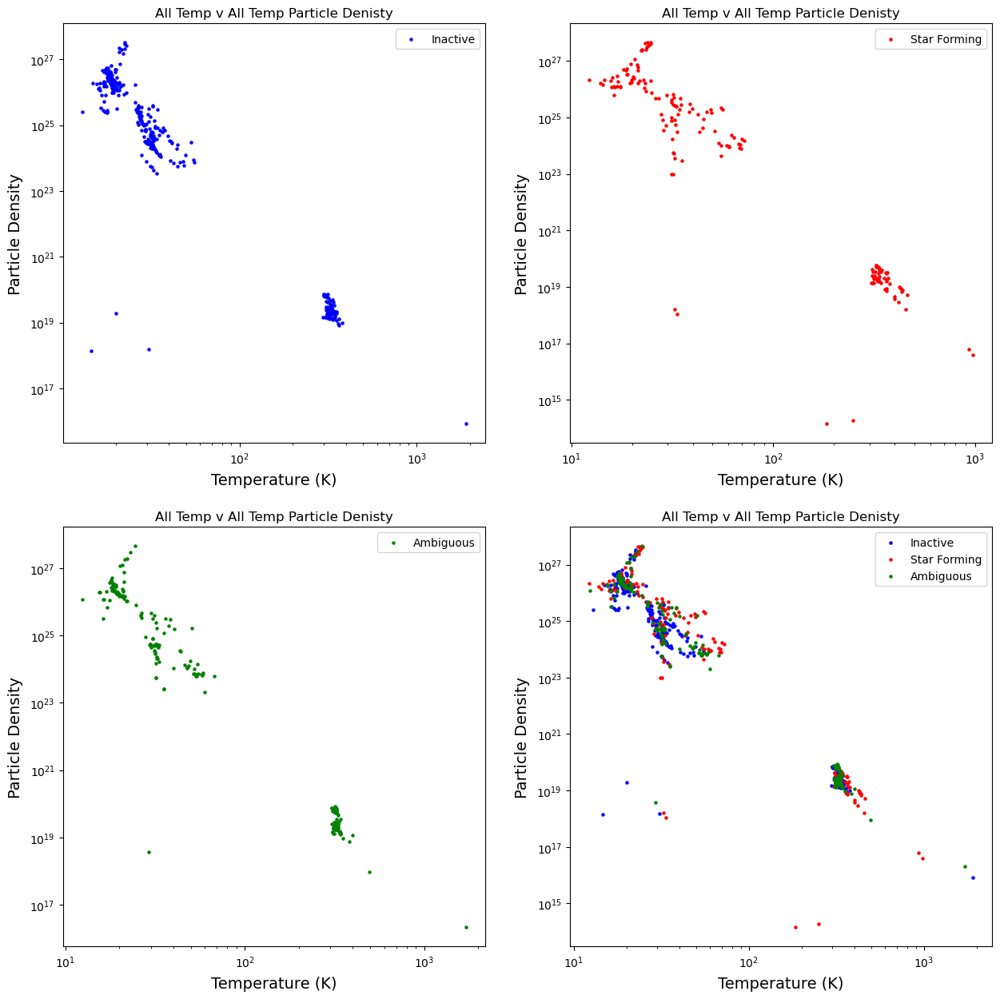

In [68]:
f, ax = plt.subplots(nrows = 2, ncols = 2, figsize = (10, 6))
ax[1,1].scatter(TT_0, NT_0, color='blue', s=5, label = 'Inactive')
ax[1,1].scatter(TT_1, NT_1, color='red', s=5, label = 'Star Forming' )
ax[1,1].scatter(TT_2, NT_2, color='green', s=5, label = 'Ambiguous')
ax[0,0].scatter(TT_0, NT_0, color='blue', s=5, label = 'Inactive')
ax[0,1].scatter(TT_1, NT_1, color='red', s=5, label = 'Star Forming' )
ax[1,0].scatter(TT_2, NT_2, color='green', s=5, label = 'Ambiguous')
#plt.xlim(-10, 200)
ax[0,0].set_yscale('log')
ax[0,1].set_yscale('log')
ax[1,0].set_yscale('log')
ax[1,1].set_yscale('log')
ax[0,0].set_xscale('log')
ax[0,1].set_xscale('log')
ax[1,0].set_xscale('log')
ax[1,1].set_xscale('log')
#plt.ylim(10e21, 10e28)
ax[0,0].set_xlabel('Temperature (K)', labelpad=6, fontsize=14)
ax[0,1].set_xlabel('Temperature (K)', labelpad=6, fontsize=14)
ax[1,0].set_xlabel('Temperature (K)', labelpad=6, fontsize=14)
ax[1,1].set_xlabel('Temperature (K)', labelpad=6, fontsize=14)
ax[0,0].set_ylabel('Particle Density', labelpad=6, fontsize=14)
ax[0,1].set_ylabel('Particle Density', labelpad=6, fontsize=14)
ax[1,0].set_ylabel('Particle Density', labelpad=6, fontsize=14)
ax[1,1].set_ylabel('Particle Density', labelpad=6, fontsize=14)
ax[0,0].set_title('All Temp v All Temp Particle Denisty')
ax[0,1].set_title('All Temp v All Temp Particle Denisty')
ax[1,0].set_title('All Temp v All Temp Particle Denisty')
ax[1,1].set_title('All Temp v All Temp Particle Denisty')
ax[0,0].legend()
ax[0,1].legend()
ax[1,0].legend()
ax[1,1].legend()
f.set_figheight(15)
f.set_figwidth(15)
plt.plot()

[]

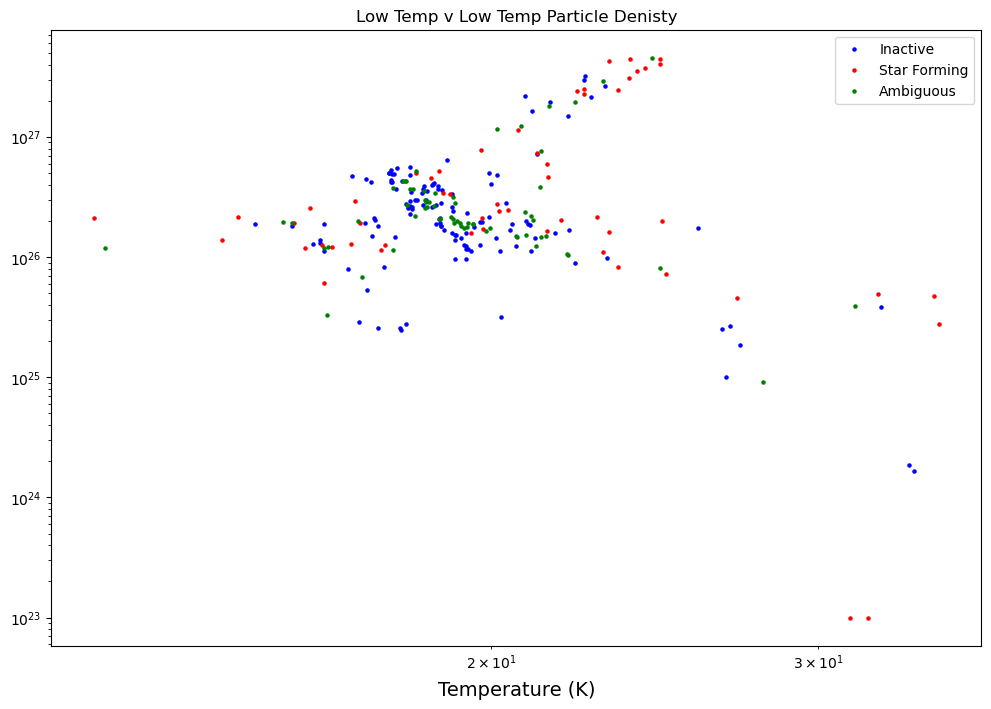

In [69]:
f, ax = plt.subplots(nrows = 1, ncols = 1, figsize = (12, 8))
ax.scatter(TL_0, NL_0, color='blue', s=5, label = 'Inactive')
#ax.errorbar(TL_0, NL_0, yerr = UN_NL0, xerr = UN_TL0, )
ax.scatter(TL_1, NL_1, color='red', s=5, label = 'Star Forming' )
ax.scatter(TL_2, NL_2, color='green', s=5, label = 'Ambiguous')
ax.set_yscale('log')
ax.set_xscale('log')
ax.set_xlabel('Temperature (K)', labelpad=6, fontsize=14)
ax.set_title('Low Temp v Low Temp Particle Denisty')
ax.legend()
plt.plot()

[]

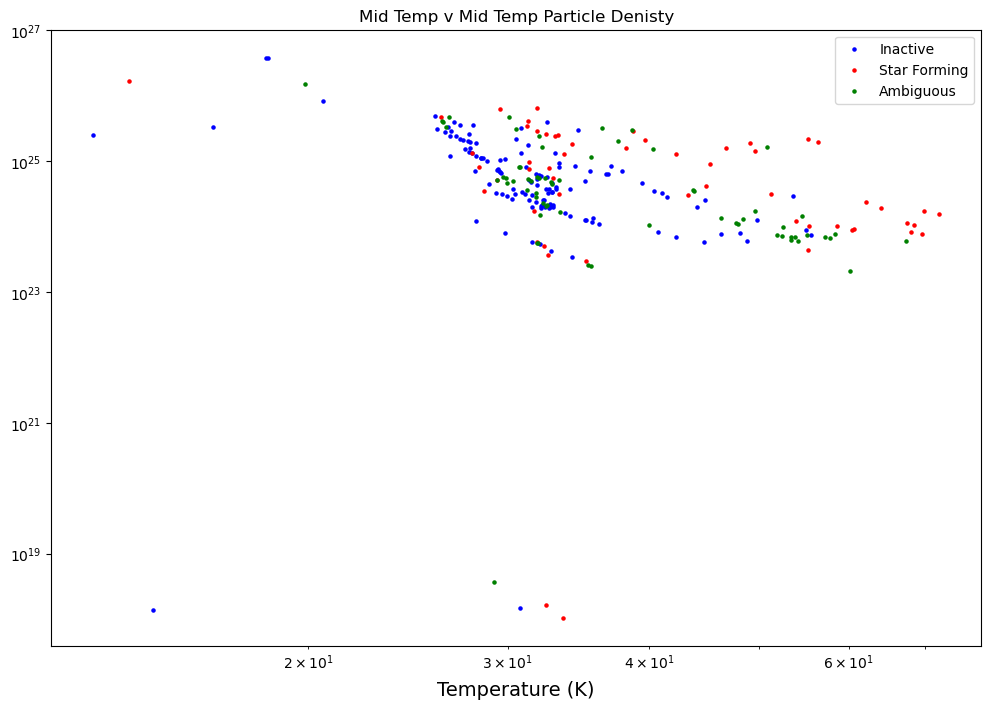

In [70]:
f, ax = plt.subplots(nrows = 1, ncols = 1, figsize = (12, 8))
ax.scatter(TM_0, NM_0, color='blue', s=5, label = 'Inactive')
ax.scatter(TM_1, NM_1, color='red', s=5, label = 'Star Forming' )
ax.scatter(TM_2, NM_2, color='green', s=5, label = 'Ambiguous')
ax.set_yscale('log')
ax.set_xscale('log')
ax.set_xlabel('Temperature (K)', labelpad=6, fontsize=14)
ax.set_title('Mid Temp v Mid Temp Particle Denisty')
ax.legend()
plt.plot()

[]

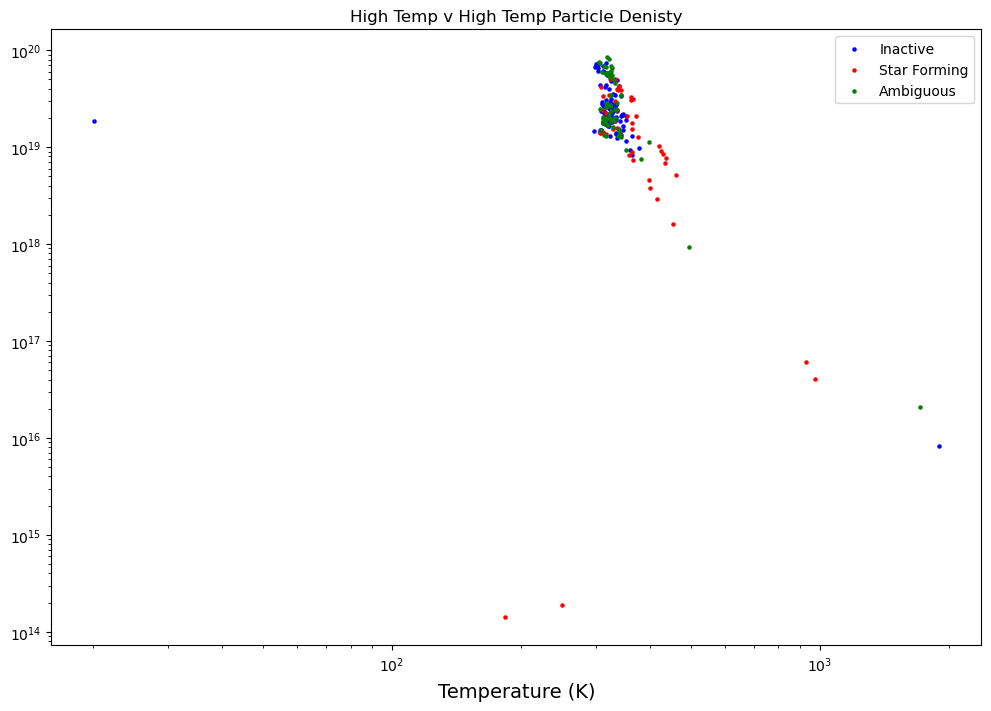

In [71]:
f, ax = plt.subplots(nrows = 1, ncols = 1, figsize = (12, 8))
ax.scatter(TH_0, NH_0, color='blue', s=5, label = 'Inactive')
ax.scatter(TH_1, NH_1, color='red', s=5, label = 'Star Forming' )
ax.scatter(TH_2, NH_2, color='green', s=5, label = 'Ambiguous')
ax.set_yscale('log')
ax.set_xscale('log')
ax.set_xlabel('Temperature (K)', labelpad=6, fontsize=14)
ax.set_title('High Temp v High Temp Particle Denisty')
ax.legend()
plt.plot()

[]

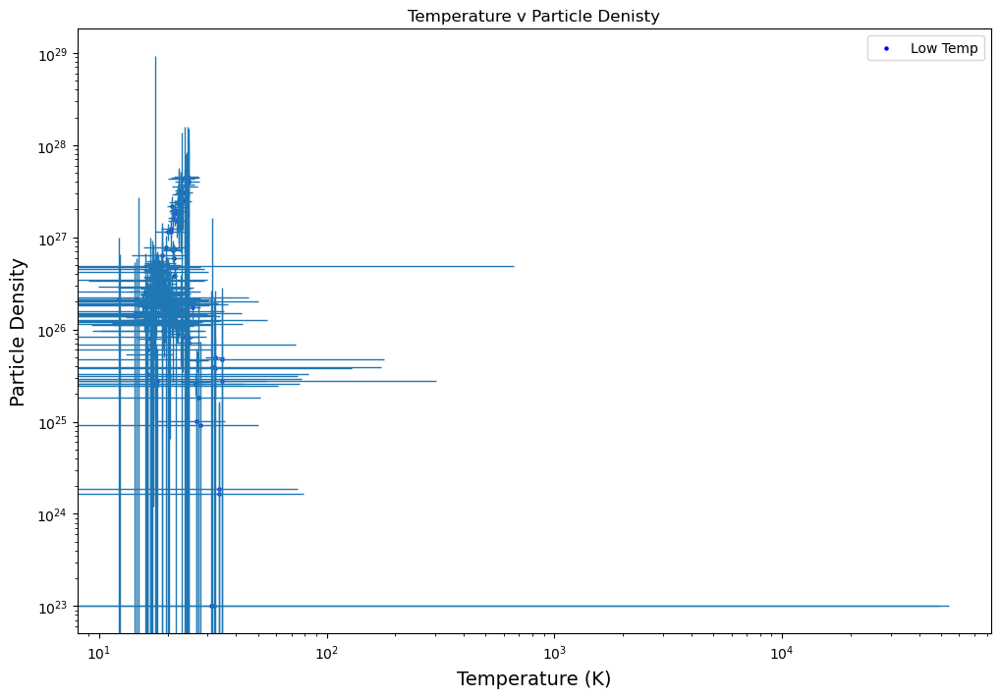

In [72]:
fig, ax = plt.subplots(nrows = 1, ncols = 1, figsize = (12, 8))
 
#ax.scatter(TH, NH, color='red', label = 'High Temp', s=5)
#ax.errorbar(TH, NH, yerr=UN_NH, xerr= UN_TH, ls='', elinewidth = 1)


#ax.scatter(TM, NM, color='purple', label = 'Mid Temp', s=5)
#ax.errorbar(TM, NM, yerr=UN_NM, xerr= UN_TM, ls='', elinewidth = 1)
ax.scatter(TL, NL, color='blue', label = 'Low Temp', s=5)
ax.errorbar(TL, NL, yerr=UN_NL, xerr= UN_TL, ls='', elinewidth = 1)
#ax.set_xlim(10, 105)
#ax.set_ylim(10e14, 10e27)
ax.set_xlabel('Temperature (K)', labelpad=6, fontsize=14)
ax.set_ylabel('Particle Density', labelpad=6, fontsize=14)
ax.set_yscale('log')
ax.set_xscale('log')
ax.set_title('Temperature v Particle Denisty')
ax.legend()
plt.savefig('Temp_Dens_plot.png')
plt.plot()

In [59]:
print('Averages')
print('SF Regions')
print('Low Temp:')
print(Avg_TL1, Avg_CSL1)
print('Mid Temp:')
print(Avg_TM1, Avg_CSM1)
print('High Temp:')
print(Avg_TH1, Avg_CSH1)

print('Non SF Regions')
print('Low Temp:')
print(Avg_TL0, Avg_CSL0)
print('Mid Temp:')
print(Avg_TM0, Avg_CSM0)
print('High Temp:')
print(Avg_TH0, Avg_CSH0)

print('Uncertain Regions')
print('Low Temp:')
print(Avg_TL2, Avg_CSL2)
print('Mid Temp:')
print(Avg_TM2, Avg_CSM2)
print('High Temp:')
print(Avg_TH2, Avg_CSH2)

Averages
SF Regions
Low Temp:
21.42 2.1791737982977972e+26
Mid Temp:
34.8 3.3727636590286943e+24
High Temp:
276.83 2.8119852109489627e+19
Non SF Regions
Low Temp:
18.73 2.283138866794083e+26
Mid Temp:
32.57 3.8284644323908065e+24
High Temp:
261.41 2.731176774420954e+19
Uncertain Regions
Low Temp:
19.13 2.067608944112673e+26
Mid Temp:
32.7 3.279004289727675e+24
High Temp:
259.09 2.974424009539556e+19


In [95]:
x = L3[np.where(Core_State==0)]
y = L3[np.where(Core_State==1)]
z = L3[np.where(Core_State==2)]

ABBA_0 = catalog['DustTemperature'][np.isin(catalog['index'], x)]
ABBA_1 = catalog['DustTemperature'][np.isin(catalog['index'], y)]
ABBA_2 = catalog['DustTemperature'][np.isin(catalog['index'], z)]
DunkinDonuts = catalog['herschel_column'][np.isin(catalog['index'], L3)]*10000

[]

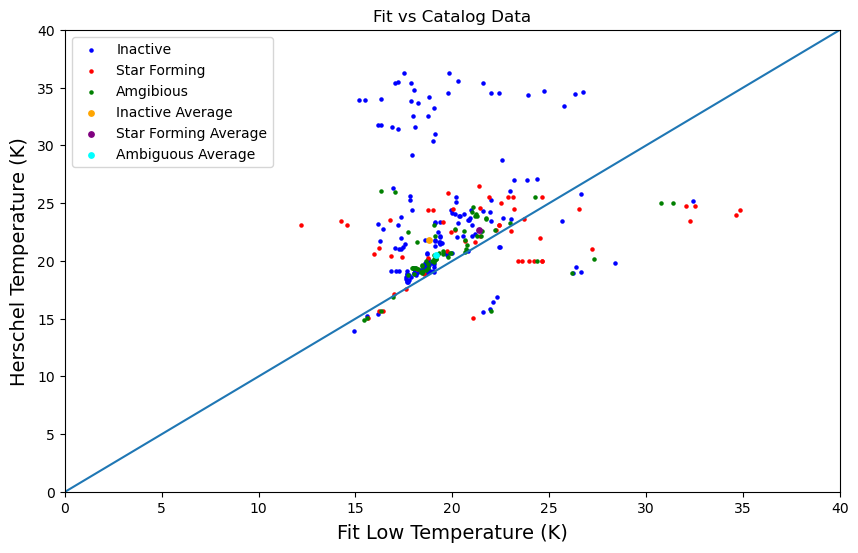

In [96]:
fig, ax = plt.subplots(nrows = 1, ncols = 1, figsize = (10, 6))
ax.scatter(TL_0, ABBA_0, color='blue', label = 'Inactive', s=5)
ax.scatter(TL_1, ABBA_1, color='red', label = 'Star Forming', s=5)
ax.scatter(TL_2, ABBA_2, color='green', label = 'Amgibious', s=5)
ax.scatter(Avg_TL0, np.median(ABBA_0), color='orange', s=15, label = 'Inactive Average')
ax.scatter(Avg_TL1, np.median(ABBA_1), color='purple', s=15, label = 'Star Forming Average' )
ax.scatter(Avg_TL2, np.median(ABBA_2), color='cyan', s=15, label = 'Ambiguous Average')
ax.axline((0, 0), slope=1)
#MT = plt.scatter(t['Mid Temp'], ABBA, color='purple', label = 'Mid Temp Fit', s=5, marker = 'x')
#HD = plt.scatter(ABBA, ABBA, color='red', label = 'Herschel Column', s=10, marker = '*')
ax.set_xlim(0, 40)
ax.set_ylim(0, 40)
ax.set_xlabel('Fit Low Temperature (K)', labelpad=6, fontsize=14)
ax.set_ylabel('Herschel Temperature (K)', labelpad=6, fontsize=14)
#plt.yscale('log')
#plt.xscale('log')
ax.set_title('Fit vs Catalog Data')
#plt.figure(figsize = (10,6))
plt.legend()
plt.plot()

In [108]:
x = L3[np.where(Core_State==0)]
y = L3[np.where(Core_State==1)]
z = L3[np.where(Core_State==2)]

MASS_0 = catalog['mass'][np.isin(catalog['index'], x)]
MASS_1 = catalog['mass'][np.isin(catalog['index'], y)]
MASS_2 = catalog['mass'][np.isin(catalog['index'], z)]
DunkinDonuts = catalog['herschel_column'][np.isin(catalog['index'], L3)]*10000

[]

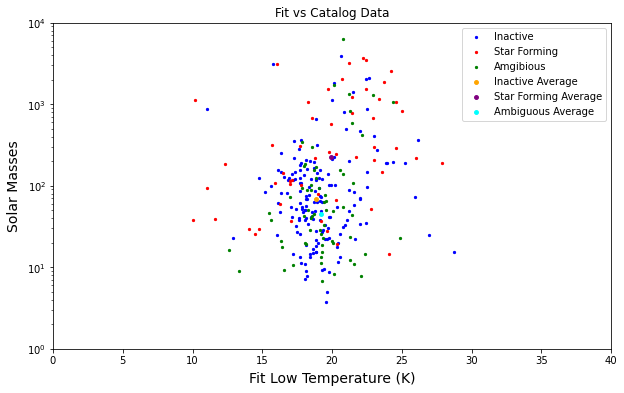

In [109]:
fig, ax = plt.subplots(nrows = 1, ncols = 1, figsize = (10, 6))
ax.scatter(TL_0, MASS_0, color='blue', label = 'Inactive', s=5)
ax.scatter(TL_1, MASS_1, color='red', label = 'Star Forming', s=5)
ax.scatter(TL_2, MASS_2, color='green', label = 'Amgibious', s=5)
ax.scatter(Avg_TL0, np.median(MASS_0), color='orange', s=15, label = 'Inactive Average')
ax.scatter(Avg_TL1, np.median(MASS_1), color='purple', s=15, label = 'Star Forming Average' )
ax.scatter(Avg_TL2, np.median(MASS_2), color='cyan', s=15, label = 'Ambiguous Average')
#ax.axline((0, 0), slope=1)
#MT = plt.scatter(t['Mid Temp'], ABBA, color='purple', label = 'Mid Temp Fit', s=5, marker = 'x')
#HD = plt.scatter(ABBA, ABBA, color='red', label = 'Herschel Column', s=10, marker = '*')
ax.set_xlim(0, 40)
ax.set_ylim(1, 10000)
ax.set_xlabel('Fit Low Temperature (K)', labelpad=6, fontsize=14)
ax.set_ylabel('Solar Masses', labelpad=6, fontsize=14)
plt.yscale('log')
#plt.xscale('log')
ax.set_title('Fit vs Catalog Data')
#plt.figure(figsize = (10,6))
plt.legend()
plt.plot()

In [110]:
x = L3[np.where(Core_State==0)]
y = L3[np.where(Core_State==1)]
z = L3[np.where(Core_State==2)]

REFF_0 = catalog['r_eff_pc'][np.isin(catalog['index'], x)]
REFF_1 = catalog['r_eff_pc'][np.isin(catalog['index'], y)]
REFF_2 = catalog['r_eff_pc'][np.isin(catalog['index'], z)]
DunkinDonuts = catalog['herschel_column'][np.isin(catalog['index'], L3)]*10000

[]

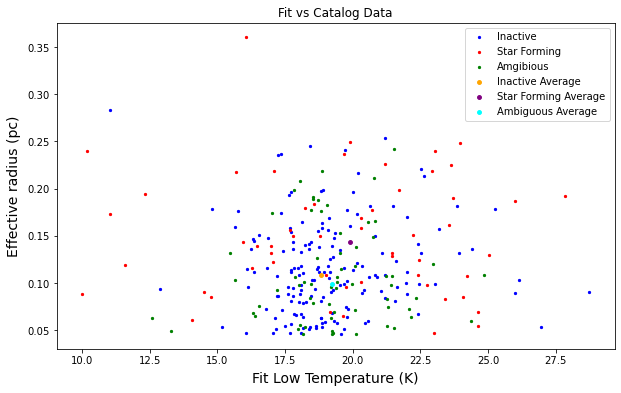

In [111]:
fig, ax = plt.subplots(nrows = 1, ncols = 1, figsize = (10, 6))
ax.scatter(TL_0, REFF_0, color='blue', label = 'Inactive', s=5)
ax.scatter(TL_1, REFF_1, color='red', label = 'Star Forming', s=5)
ax.scatter(TL_2, REFF_2, color='green', label = 'Amgibious', s=5)
ax.scatter(Avg_TL0, np.median(REFF_0), color='orange', s=15, label = 'Inactive Average')
ax.scatter(Avg_TL1, np.median(REFF_1), color='purple', s=15, label = 'Star Forming Average' )
ax.scatter(Avg_TL2, np.median(REFF_2), color='cyan', s=15, label = 'Ambiguous Average')
#ax.axline((0, 0), slope=1)
#MT = plt.scatter(t['Mid Temp'], ABBA, color='purple', label = 'Mid Temp Fit', s=5, marker = 'x')
#HD = plt.scatter(ABBA, ABBA, color='red', label = 'Herschel Column', s=10, marker = '*')
#ax.set_xlim(0, 40)
#ax.set_ylim(1, 10000)
ax.set_xlabel('Fit Low Temperature (K)', labelpad=6, fontsize=14)
ax.set_ylabel('Effective radius (pc)', labelpad=6, fontsize=14)
#plt.yscale('log')
#plt.xscale('log')
ax.set_title('Fit vs Catalog Data')
#plt.figure(figsize = (10,6))
plt.legend()
plt.plot()

[]

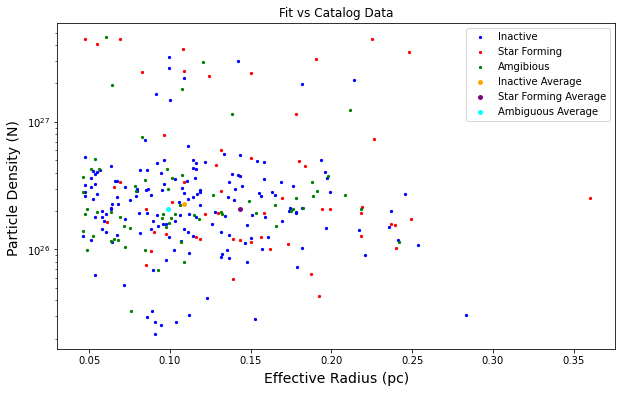

In [112]:
fig, ax = plt.subplots(nrows = 1, ncols = 1, figsize = (10, 6))
ax.scatter(REFF_0, NL_0, color='blue', label = 'Inactive', s=5)
ax.scatter(REFF_1, NL_1, color='red', label = 'Star Forming', s=5)
ax.scatter(REFF_2, NL_2, color='green', label = 'Amgibious', s=5)

ax.scatter(np.median(REFF_0), Avg_CSL0, color='orange', s=15, label = 'Inactive Average')
ax.scatter(np.median(REFF_1), Avg_CSL1, color='purple', s=15, label = 'Star Forming Average' )
ax.scatter(np.median(REFF_2), Avg_CSL2, color='cyan', s=15, label = 'Ambiguous Average')

#ax.axline((0, 0), slope=1)
#MT = plt.scatter(t['Mid Temp'], ABBA, color='purple', label = 'Mid Temp Fit', s=5, marker = 'x')
#HD = plt.scatter(ABBA, ABBA, color='red', label = 'Herschel Column', s=10, marker = '*')
#ax.set_xlim(0, 40)
#ax.set_ylim(1, 10000)
ax.set_xlabel('Effective Radius (pc)', labelpad=6, fontsize=14)
ax.set_ylabel('Particle Density (N) ', labelpad=6, fontsize=14)
plt.yscale('log')
#plt.xscale('log')
ax.set_title('Fit vs Catalog Data')
#plt.figure(figsize = (10,6))
plt.legend()
plt.plot()

[]

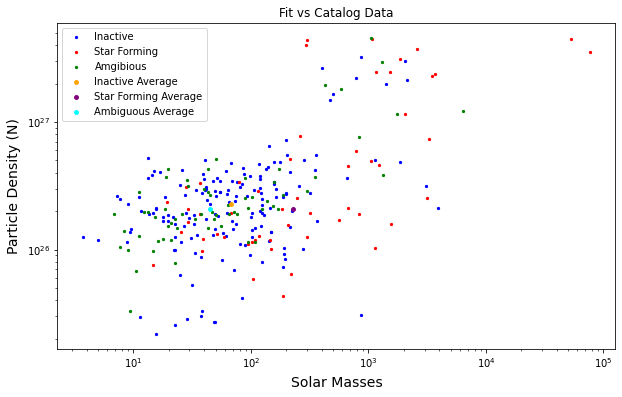

In [113]:
fig, ax = plt.subplots(nrows = 1, ncols = 1, figsize = (10, 6))
ax.scatter(MASS_0, NL_0, color='blue', label = 'Inactive', s=5)
ax.scatter(MASS_1, NL_1, color='red', label = 'Star Forming', s=5)
ax.scatter(MASS_2, NL_2, color='green', label = 'Amgibious', s=5)

ax.scatter(np.median(MASS_0), Avg_CSL0, color='orange', s=15, label = 'Inactive Average')
ax.scatter(np.median(MASS_1), Avg_CSL1, color='purple', s=15, label = 'Star Forming Average' )
ax.scatter(np.median(MASS_2), Avg_CSL2, color='cyan', s=15, label = 'Ambiguous Average')

#ax.axline((0, 0), slope=1)
#MT = plt.scatter(t['Mid Temp'], ABBA, color='purple', label = 'Mid Temp Fit', s=5, marker = 'x')
#HD = plt.scatter(ABBA, ABBA, color='red', label = 'Herschel Column', s=10, marker = '*')
#ax.set_xlim(0, 40)
#ax.set_ylim(1, 10000)
ax.set_xlabel('Solar Masses', labelpad=6, fontsize=14)
ax.set_ylabel('Particle Density (N)', labelpad=6, fontsize=14)
plt.yscale('log')
plt.xscale('log')
ax.set_title('Fit vs Catalog Data')
#plt.figure(figsize = (10,6))
plt.legend()
plt.plot()